## Imports and Path/Variable Definitions

In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
import h5py
from scipy import signal
import argparse
import seaborn as sns
from datetime import date
import os
import X_new_gnss_unet_datagen_fn22 # Module with CNN/data generator code

sns.set_style('white')

project_name = 'newfault' # Based on the name of the FakeQuakes project
fq_dir = '/hdd/rc_fq/fall24/' # Where are the FakeQuakes stored? (The final .hdf5 file)
noise_dir = '/home/sdybing/gnss-picker/data/noisedata/' # Where is the noise data stored?
realdata_dir = '/home/sdybing/gnss-picker/data/realdata/summer23/' # Where is the real data stored?

cnn_save_dir = '/home/sdybing/gnss-picker/cnn_models_outputs/' # Where do you want to save this code's outputs?
project_save_dir = cnn_save_dir + project_name + '_fq_train/'
base_figure_save_dir = project_save_dir + 'base_data_figures/' # Where to save the figures of just the data/generator tests
models_path = project_save_dir + 'models/'
if os.path.isdir(project_save_dir):
    pass
else:
    os.makedirs(project_save_dir)
    os.makedirs(base_figure_save_dir)
    os.makedirs(models_path)
    
train = False # Do you want to train?
drop = 1 # Drop?
resume = 0 # Resume training
large = 0.5 # Large unet
fac = large
epochs = 100 # How many epochs?
std = 3 # How long do you want the Gaussian STD to be?
sr = 1 # Sample rate (Hz)
epsilon = 1e-6
batch_size = 32
load = True # Loading an old trained model?
small_train = False # Train with a smaller amount of data to make sure code works?
small_test = False # Test with a smaller amount of data to make sure code works?

2024-10-15 17:25:47.292304: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-10-15 17:25:47.292345: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


## Data Loading and Formatting

### Load the Data

In [20]:
# FakeQuakes waveform data
print('Loading FakeQuakes...')
fq_data = h5py.File(fq_dir + 'newfault_gfast_test_6.hdf5', 'r')
fq_data = fq_data['data'][:,:]
# old_fq_data = h5py.File(fq_dir + 'july6_128samps_fq_wvfm_data_formatted.hdf5', 'r')
# old_fq_data = old_fq_data['data'][:,:]

# FakeQuakes metadata
print('Loading FakeQuakes metadata...')
fq_metadata = np.load(fq_dir + 'newfault_gfast_test_6_info.npy')

# Noise data
print('Loading noise...')
all_noise_data = h5py.File(noise_dir + 'summer23_128samps_all_noise_samples.hdf5', 'r')
all_noise_data = all_noise_data['all_noise_samples'][:,:]

# Demeaned real waveform data
print('Loading real data...')
real_data = h5py.File(realdata_dir + 'demean_realdata_rembad.hdf5', 'r')
real_data = real_data['demean_realdata_rembad'][:,:]

# Real metadata
print('Loading real metadata...')
real_metadata = np.load(realdata_dir + 'real_metadata_rembad_w_gauss_pos_mag.npy')

# Trim noise data to match length of FakeQuakes data
noise_data = all_noise_data[:len(fq_data)]

# Array of NaNs to use to match added noise in concatenation later
nan_array = np.empty((len(fq_data), 3))
nan_array[:] = np.NaN

# Real data

# Check shapes
print('FakeQuakes shape: ' + str(fq_data.shape))
print('Noise data shape: ' + str(noise_data.shape))
print('Real data shape: ' + str(real_data.shape))


Loading FakeQuakes...
Loading FakeQuakes metadata...
Loading noise...
Loading real data...
Loading real metadata...
FakeQuakes shape: (20683, 384)
Noise data shape: (20683, 768)
Real data shape: (994155, 384)


In [21]:
noise_data.shape

(20683, 768)

### Format and Split Training, Validation, and Testing Data

In [22]:
np.random.seed(27)

# Earthquake/signal data
fqinds = np.arange(fq_data.shape[0]) # Signal indices
np.random.shuffle(fqinds) # Shuffles the indices
# train_fqinds = fqinds[:int(0.8*len(fqinds))] # Training data separation: grabs the front 80% of the numbers
# valid_fqinds = fqinds[int(0.8*len(fqinds)):int(0.9*len(fqinds)):] # Grabs the next 10% (80-90%)
test_fqinds = fqinds # Grabs the last 10% (90%-end)

# Noise data
noiseinds = np.arange(noise_data.shape[0]) # Noise indices
np.random.shuffle(noiseinds) # Shuffles the indices
# train_noiseinds = noiseinds[:int(0.8*len(noiseinds))] # Data separation as above
# valid_noiseinds = noiseinds[int(0.8*len(noiseinds)):int(0.9*len(noiseinds))]
test_noiseinds = noiseinds

# Check shapes to confirm compatability
print('Full FakeQuakes data shape: ' + str(fqinds.shape))
# print('FakeQuakes training data shape: ' + str(train_fqinds.shape))
# print('FakeQuakes validation data shape: ' + str(valid_fqinds.shape))
print('FakeQuakes testing data shape: ' + str(test_fqinds.shape))
print('Full noise data shape: ' + str(noiseinds.shape))
# print('Noise training data shape: ' + str(train_noiseinds.shape))
# print('Noise validation data shape: ' + str(valid_noiseinds.shape))
print('Noise testing data shape: ' + str(test_noiseinds.shape))


Full FakeQuakes data shape: (20683,)
FakeQuakes testing data shape: (20683,)
Full noise data shape: (20683,)
Noise testing data shape: (20683,)


In [23]:
test_fqinds

array([ 5249,  6885, 13205, ...,  3912, 20152,  5139])

In [24]:
fq_metadata

array([['newfault.000000', 'P467', '7.5357', '16'],
       ['newfault.000000', 'P629', '7.5357', '34'],
       ['newfault.000000', 'P590', '7.5357', '13'],
       ...,
       ['newfault.001779', 'P298', '6.0685', '38'],
       ['newfault.001779', 'ACSX', '6.0685', '36'],
       ['newfault.001779', 'P581', '6.0685', '19']], dtype='<U15')

In [25]:
fq_data.shape

(20683, 384)

In [26]:
noise_data.shape

(20683, 768)

## Test of Data Generator

(20683, 128)
(20683, 128)
(20683, 128)
(20683,)
(20683, 128)
(20683, 128)
(20683, 128)
(20683, 4)
(20683,)
(20683, 128)
Final shapes:
New batch: (20683, 128, 3)
New batch norm: (20683, 128, 3)
Batch target: (20683, 128)
Metadata: (20683, 4)
Data generator check original data shape: (20683, 128, 3)
Data generator check normalized data shape: (20683, 128, 3)
Data generator check target shape: (20683, 128)
Data generator check metadata shape: (20683, 4)


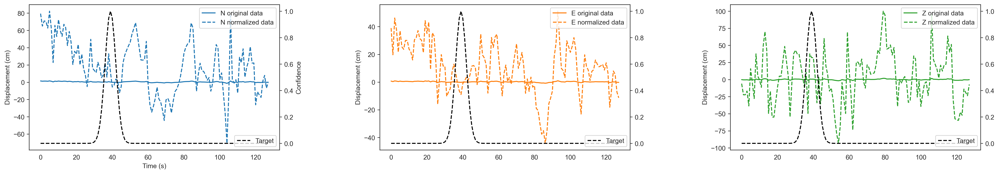

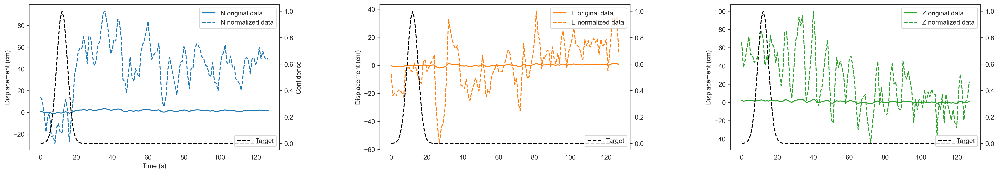

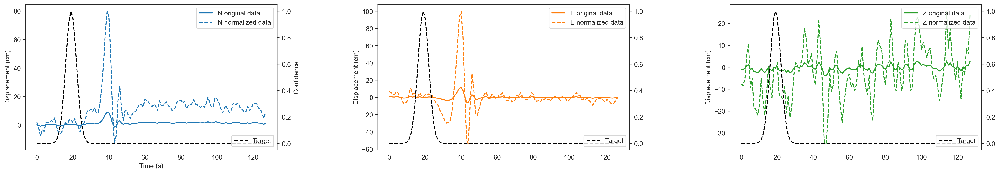

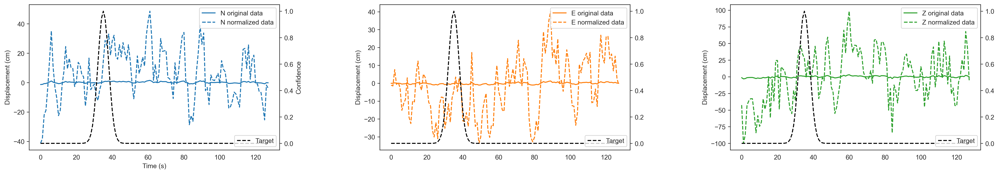

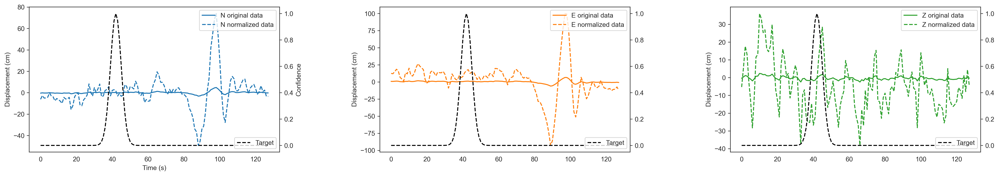

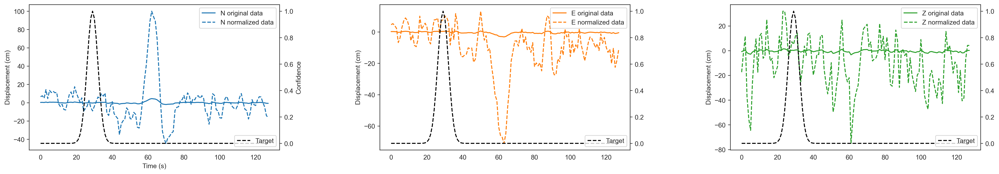

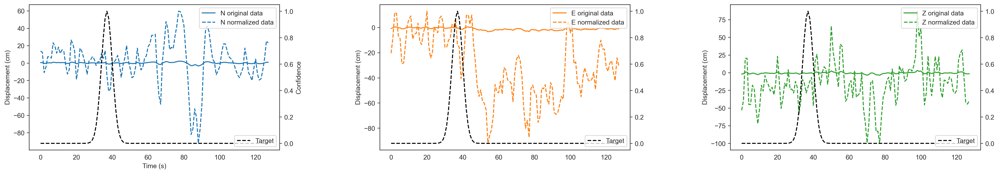

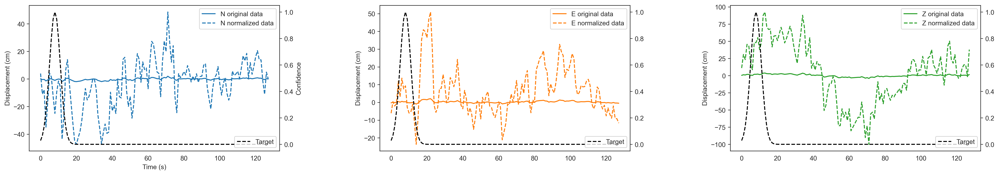

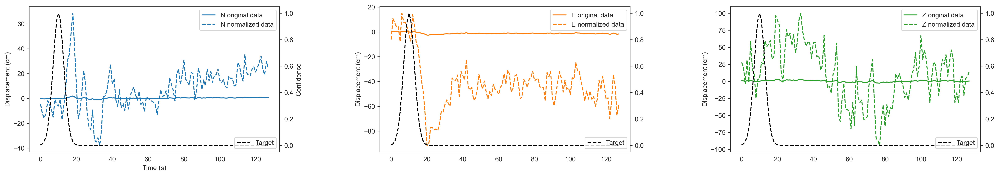

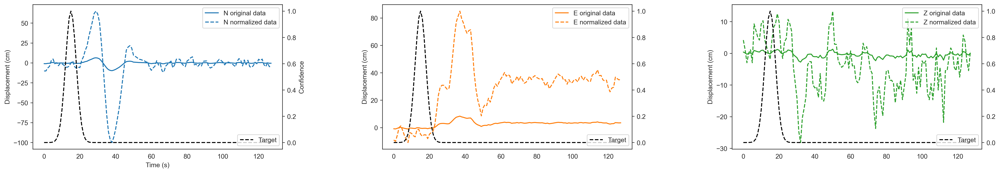

In [27]:
num_fqtest = len(test_fqinds)

checkgen = X_new_gnss_unet_datagen_fn22.gfast_test_data_generator(num_fqtest, fq_data, noise_data, fq_metadata, test_fqinds, test_noiseinds, sr, std, valid = True) # Valid = True to get original data back
checkgen_orig_data, checkgen_norm_data, checkgen_target, checkgen_metadata = next(checkgen) 

print('Data generator check original data shape: ' + str(checkgen_orig_data.shape))
print('Data generator check normalized data shape: ' + str(checkgen_norm_data.shape))
print('Data generator check target shape: ' + str(checkgen_target.shape))
print('Data generator check metadata shape: ' + str(checkgen_metadata.shape))

# Shapes:
    # data: (batch_size, 128, 3) # N, E, Z
    # target: (batch_size, 128)
    # metadata: (batch_size, 3) Rupt name, station name, magnitude

# Plot generator results

nexamples = 10 # Number of examples to look at 
  
for ind in range(nexamples): 
    
#     print('Magnitude: ' + str(metadata[ind,2]))

    fig = plt.subplots(nrows = 1, ncols = 3, figsize = (26,4), dpi = 300) # shoter for AGU talk
    plt.subplots_adjust(wspace = 0.4)
    t = 1/sr * np.arange(checkgen_orig_data.shape[1])
    
    ax1 = plt.subplot(131)
    ax1.plot(t, checkgen_orig_data[ind,:,0]*100, label = 'N original data', color = 'C0')
    ax1.plot(t, checkgen_norm_data[ind,:,0]*100, label = 'N normalized data', color = 'C0', linestyle = '--')
    ax1.set_ylabel('Displacement (cm)')
    ax1.set_xlabel('Time (s)')
    ax1.legend(loc = 'upper right')
    ax2 = ax1.twinx()
    ax2.plot(t, checkgen_target[ind,:], color = 'black', linestyle = '--', label = 'Target')
    ax2.set_ylabel('Confidence')
    ax2.legend(loc = 'lower right')
    
    ax3 = plt.subplot(132)
    ax3.plot(t, checkgen_orig_data[ind,:,1]*100, label = 'E original data', color = 'C1')
    ax3.plot(t, checkgen_norm_data[ind,:,1]*100, label = 'E normalized data', color = 'C1', linestyle = '--')
    ax3.set_ylabel('Displacement (cm)')
    ax3.legend(loc = 'upper right')
    ax4 = ax3.twinx()
    ax4.plot(t, checkgen_target[ind,:], color = 'black', linestyle = '--', label = 'Target')
    ax4.legend(loc = 'lower right')
    
    ax5 = plt.subplot(133)
    ax5.plot(t, checkgen_orig_data[ind,:,2]*100, label = 'Z original data', color = 'C2')
    ax5.plot(t, checkgen_norm_data[ind,:,2]*100, label = 'Z normalized data', color = 'C2', linestyle = '--')
    ax5.set_ylabel('Displacement (cm)')
    ax5.legend(loc = 'upper right')
    ax6 = ax5.twinx()
    ax6.plot(t, checkgen_target[ind,:], color = 'black', linestyle = '--', label = 'Target')
    ax6.legend(loc = 'lower right')
    
    plt.show()
#     plt.savefig(base_figure_save_dir + '3_ex' + str(ind) + '_plot_generator_pass.png', format = 'PNG')
#     plt.close()


## Model Construction

In [28]:
if drop: # Use a model with a dropout layer
    model = X_new_gnss_unet_datagen_fn22.make_large_unet_drop(fac, sr, ncomps = 3)
    print('Using model with dropout')
else:
    model = X_new_gnss_unet_datagen_fn22.make_large_unet(fac, sr, ncomps = 3)  
    print('Using large model')
    

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 3)]     0           []                               
                                                                                                  
 conv1d_7 (Conv1D)              (None, 128, 16)      1024        ['input_2[0][0]']                
                                                                                                  
 max_pooling1d_3 (MaxPooling1D)  (None, 64, 16)      0           ['conv1d_7[0][0]']               
                                                                                                  
 conv1d_8 (Conv1D)              (None, 64, 32)       7712        ['max_pooling1d_3[0][0]']        
                                                                                            

/home/sdybing/anaconda3/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


## Load an old trained model?

In [29]:
if load:
    loaddate = '2024-10-01' # Format: YYYY-MM-DD
    model_load_file = project_save_dir + 'models/traindate_' + str(loaddate) + '/bestmodel_traindate_' + str(loaddate) + '.h5'
    data_save_dir = models_path + 'traindate_' + str(loaddate) + '/data/' # Where to save the outputted testing data and predictions
    figure_save_dir = models_path + 'traindate_' + str(loaddate) + '/figures/'
    print('Loading training results from ' + model_load_file)
    
    model.load_weights(model_load_file)

Loading training results from /home/sdybing/gnss-picker/cnn_models_outputs/newfault_fq_train/models/traindate_2024-10-01/bestmodel_traindate_2024-10-01.h5


## Test the Model with Remaining FakeQuakes Data

### See how testing works with a smaller dataset (faster)?

In [30]:
if small_test:
    test_fqinds = test_fqinds[:100]
    test_noiseinds = test_noiseinds[:100]
    

### Test the model

In [31]:
fqtestdate = date.today()
num_fqtest = len(test_fqinds) # Number of samples to test with
# print(num_fqtest)

fqtestmodel = X_new_gnss_unet_datagen_fn22.gfast_test_data_generator(num_fqtest, fq_data, noise_data, fq_metadata, test_fqinds, test_noiseinds, sr, std, valid = True)
fqtest_orig_data, fqtest_norm_data, fqtest_target, fqtest_metadata = next(fqtestmodel)
print('Predicting...')
fqtest_predictions = model.predict(fqtest_norm_data)

print('FQ test original data shape: ' + str(fqtest_orig_data.shape))
print('FQ test normalized data shape: ' + str(fqtest_norm_data.shape))
print('FQ test metadata shape: ' + str(fqtest_metadata.shape))
print('FQ test target shape: ' + str(fqtest_target.shape))
print('FQ test predictions shape: ' + str(fqtest_predictions.shape))


(20683, 128)
(20683, 128)
(20683, 128)
(20683,)
(20683, 128)
(20683, 128)
(20683, 128)
(20683, 4)
(20683,)
(20683, 128)
Final shapes:
New batch: (20683, 128, 3)
New batch norm: (20683, 128, 3)
Batch target: (20683, 128)
Metadata: (20683, 4)
Predicting...
FQ test original data shape: (20683, 128, 3)
FQ test normalized data shape: (20683, 128, 3)
FQ test metadata shape: (20683, 4)
FQ test target shape: (20683, 128)
FQ test predictions shape: (20683, 128)


### Save the FQ testing data, targets, metadata, and predictions as .npys

In [32]:
np.save(data_save_dir + str(fqtestdate) + '_gfast_bigger_fqtest_orig_data.npy', fqtest_orig_data)
np.save(data_save_dir + str(fqtestdate) + '_gfast_bigger_fqtest_norm_data.npy', fqtest_norm_data)
np.save(data_save_dir + str(fqtestdate) + '_gfast_bigger_fqtest_metadata.npy', fqtest_metadata)
np.save(data_save_dir + str(fqtestdate) + '_gfast_bigger_fqtest_target.npy', fqtest_target)
np.save(data_save_dir + str(fqtestdate) + '_gfast_bigger_fqtest_predictions.npy', fqtest_predictions)


### Plot checks of FQ testing data and predictions

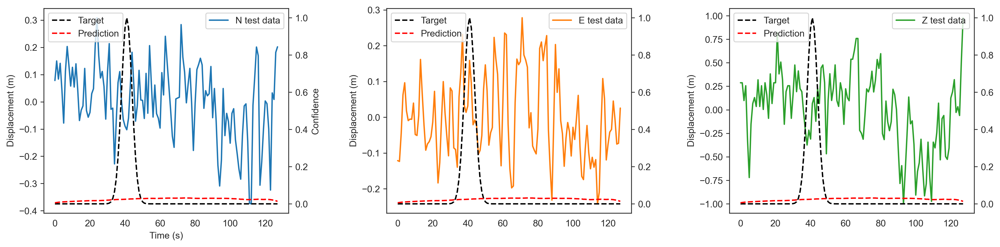

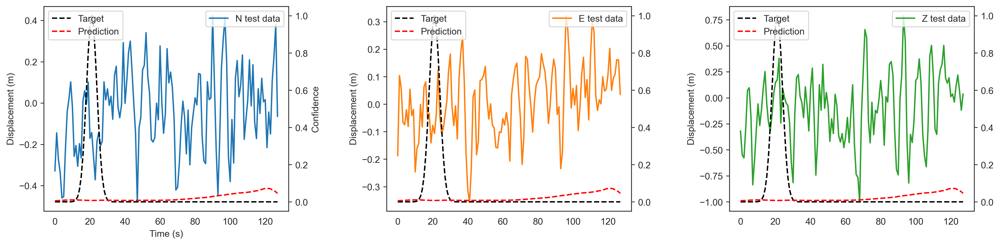

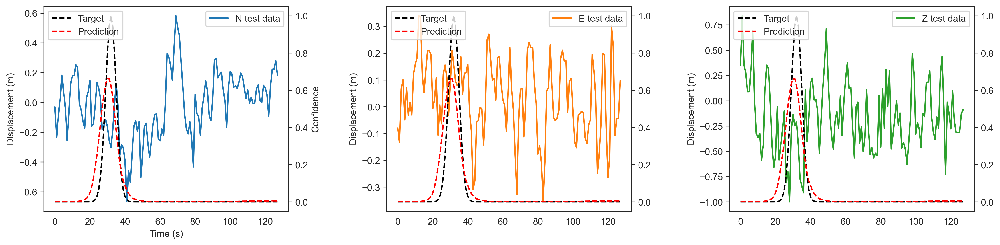

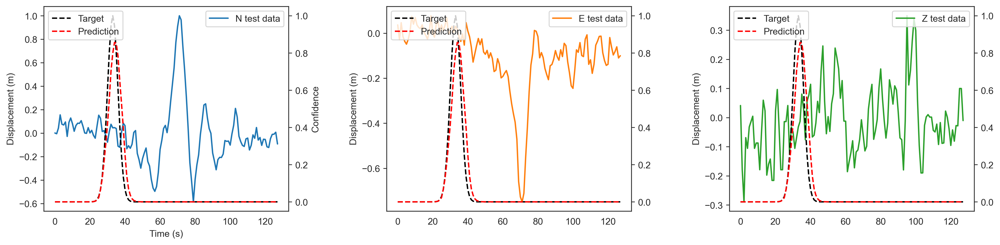

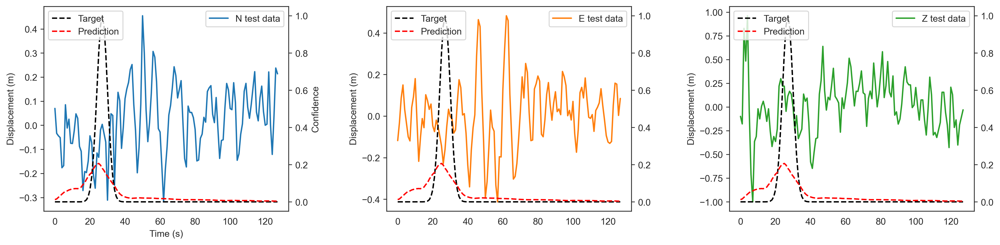

In [33]:
nexamples = 5 # Number of examples to look at 
  
for ind in range(nexamples): 
    
    fig = plt.subplots(nrows = 1, ncols = 3, figsize = (18,4), dpi = 300)
    plt.subplots_adjust(wspace = 0.4)
    t = 1/sr * np.arange(fqtest_orig_data.shape[1])
    # print(t)
    
    ax1 = plt.subplot(131)
    ax1.plot(t, fqtest_norm_data[ind,:,0], label = 'N test data', color = 'C0')
    ax1.set_ylabel('Displacement (m)')
    ax1.set_xlabel('Time (s)')
    ax1.legend(loc = 'upper right')
    ax2 = ax1.twinx()
    ax2.plot(t, fqtest_target[ind,:], color = 'black', linestyle = '--', label = 'Target')
    ax2.plot(t, fqtest_predictions[ind,:], color = 'red', linestyle = '--', label = 'Prediction')
    ax2.set_ylabel('Confidence')
    ax2.set_ylim(-0.05,1.05)
    ax2.legend(loc = 'upper left')
    
    ax3 = plt.subplot(132)
    ax3.plot(t, fqtest_norm_data[ind,:,1], label = 'E test data', color = 'C1')
    ax3.set_ylabel('Displacement (m)')
    ax3.legend(loc = 'upper right')
    ax4 = ax3.twinx()
    ax4.plot(t, fqtest_target[ind,:], color = 'black', linestyle = '--', label = 'Target')
    ax4.plot(t, fqtest_predictions[ind,:], color = 'red', linestyle = '--', label = 'Prediction')
    ax4.set_ylim(-0.05,1.05)
    ax4.legend(loc = 'upper left')
    
    ax5 = plt.subplot(133)
    ax5.plot(t, fqtest_norm_data[ind,:,2], label = 'Z test data', color = 'C2')
    ax5.set_ylabel('Displacement (m)')
    ax5.legend(loc = 'upper right')
    ax6 = ax5.twinx()
    ax6.plot(t, fqtest_target[ind,:], color = 'black', linestyle = '--', label = 'Target')
    ax6.plot(t, fqtest_predictions[ind,:], color = 'red', linestyle = '--', label = 'Prediction')
    ax6.set_ylim(-0.05,1.05)
    ax6.legend(loc = 'upper left')
    
    plt.show()
#     plt.savefig(figure_save_dir + '6_fqtestdata_ex' + str(ind) + '_plot_test_predictions.png', format = 'PNG')
#     plt.close()


In [34]:
# Calculate PGD timeseries

fqtest_orig_data.shape

(20683, 128, 3)